<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Explanation-for-class-logits" data-toc-modified-id="Explanation-for-class-logits-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Explanation for class logits</a></span><ul class="toc-item"><li><span><a href="#Additional-logit-explanations" data-toc-modified-id="Additional-logit-explanations-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Additional logit explanations</a></span></li><li><span><a href="#Comparison-to-post-hoc" data-toc-modified-id="Comparison-to-post-hoc-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Comparison to post-hoc</a></span></li><li><span><a href="#Ambiguous-examples" data-toc-modified-id="Ambiguous-examples-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Ambiguous examples</a></span></li></ul></li><li><span><a href="#Visualise-intermediate-neurons" data-toc-modified-id="Visualise-intermediate-neurons-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Visualise intermediate neurons</a></span></li><li><span><a href="#CIFAR10-—-B-ablation" data-toc-modified-id="CIFAR10-—-B-ablation-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>CIFAR10 — B-ablation</a></span></li></ul></div>

In [1]:
%matplotlib inline


%load_ext autoreload
%autoreload 2


!git pull




import numpy as np
from experiments.Imagenet.bcos.model import get_model
from experiments.Imagenet.bcos.experiment_parameters import exps
from data.data_handler import Data
from data.data_transforms import AddInverse
from interpretability.utils import grad_to_img, explanation_mode
from torch.autograd import Variable
from project_utils import to_numpy, to_numpy_img
import matplotlib.pyplot as plt
import seaborn as sns
from os.path import join
import os
import json
import torch
from data.imagenet_classnames import name_map
sns.set_style("white")


from torch.hub import download_url_to_file

from project_utils import get_precomputed_results
get_precomputed_results()


Already up to date.
No precomputed results found. Necessary for plotting. Downloading now.



Done.


In [2]:
exp_params = exps["densenet_121_cossched"]
data = Data("Imagenet", only_test_loader=True, **exp_params)
data_loader = data.get_test_loader()

model = get_model(exp_params).cuda()

# Explanation for class logits

In [3]:
img = data_loader.dataset[50*14 + 4][0][None].cuda()

The B-cos networks are trained with images encoded as 
$$\text{pixel} = [r, g, b, 1-r, 1-g, 1-b],$$
see Section 4 in the paper. As such, the images have 6 color channels.

In [4]:
_img = Variable(AddInverse()(img), requires_grad=True)  
print("Image shape: ", _img.shape)

Image shape:  torch.Size([1, 6, 224, 224])


In order to compute the dynamic linear transforms $\mathbf W_{1\rightarrow L}(\mathbf x)$
we detach the dynamically computed linear transforms from the computational graph in the forward pass in each layer.
This allows to calculate $\mathbf W_{1\rightarrow L}(\mathbf x)$ with a simple out.backward() call.

In [5]:
# Setting detaching to True
explanation_mode(model, True)

In the following, we compute the top 2 predictions of the model for the chosen image and visualise the corresponding matrix rows.

In [6]:
# Top 2 predictions
top2, c_idcs = model(_img)[0].topk(2)

In [7]:
# Compute w_1:
_img.grad = None
top2[0].backward(retain_graph=True)
w1 = _img.grad
_img.grad = None
top2[1].backward()
w2 = _img.grad


Note that the model computations are (up to numerical errors) _exactly_ summarised by the linear transforms:

In [8]:
print(f"Full model output: y_1 = {top2[0]:.3f} | linear summary:  w_1 * x + b = {(_img*w1).sum() + model[-1].bias:.3f}")
print(f"Full model output: y_2 = {top2[1]:.3f} | linear summary:  w_2 * x + b = {(_img*w2).sum() + model[-1].bias:.3f}")

Full model output: y_1 = 0.675 | linear summary:  w_1 * x + b = 0.675
Full model output: y_2 = -2.844 | linear summary:  w_2 * x + b = -2.844


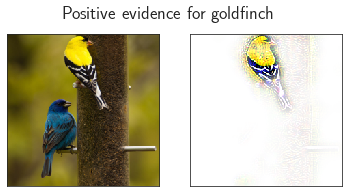

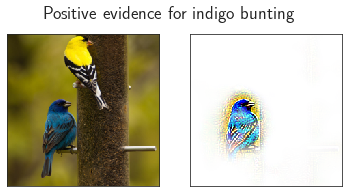

In [9]:
sns.set_style("white")
for logit, c_idx, w in zip(top2, c_idcs, [w1[0], w2[0]]):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 3))
    # The 'positive evidence' is derived from those locations that have a net positive contribution
    # to the respective output, according to the linear transformation matrix W_{1->L}
    fig.suptitle(f"Positive evidence for {name_map[c_idx.item()].split(',')[0]}", fontsize=18)
    ax1.imshow(to_numpy_img(img[0]))
    # Decoding the linear transform w based on the angles of the color channels.
    # Only showing positively contributing pixels.
    ax2.imshow(grad_to_img(_img[0], w))
    for ax in [ax1, ax2]:
        ax.set_xticks([])
        ax.set_yticks([])


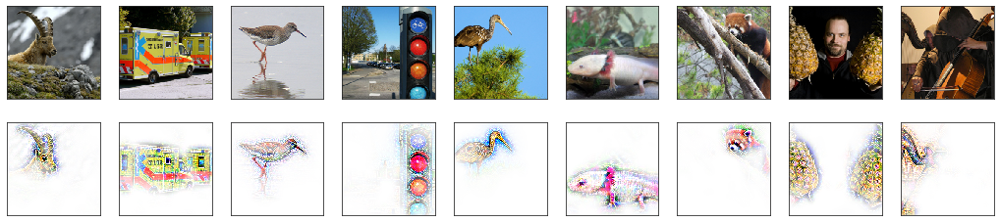

In [10]:
# Images shown in Fig. 1 in the paper
imgs = [17532, 20381, 7075, 46001, 6796, 1484, 19393, 47687, 29748]
fig, (img_axes, w_axes) = plt.subplots(2, len(imgs), figsize=(len(imgs)*2, 4))

for ax in img_axes:
    ax.set_xticks([])
    ax.set_yticks([])

for ax in w_axes:
    ax.set_xticks([])
    ax.set_yticks([])

    explanation_mode(model, True)
for ax_idx, img_idx in enumerate(imgs):
    model.zero_grad()
    img = data_loader.dataset[img_idx][0][None].cuda()    
    _img = Variable(AddInverse()(img), requires_grad=True)  
    model(_img)[0, img_idx//50].backward()
    w = _img.grad[0]
    img_axes[ax_idx].imshow(to_numpy_img(img[0]))
    w_axes[ax_idx].imshow(grad_to_img(_img[0], w))
    
fig.savefig("docs/media/example_figure.png")
    

## Additional logit explanations

In [11]:
!git pull

Already up to date.


In [12]:
from interpretability.visualise_neurons import visualise_class_explanations

In [13]:
# Logits only precomputed for densenet_121_cossched
exp_params = exps["densenet_121_cossched"]
data = Data("Imagenet", only_test_loader=True, **exp_params)
data_loader = data.get_test_loader()
model = get_model(exp_params).cuda()
explanation_mode(model)

In [14]:
num_classes = 2
imgs_per_class = 3
logits = torch.from_numpy(np.loadtxt(f"results/{exp_params['exp_name']}/logits.np"))
max_vals, offset = torch.topk((logits.max(axis=1)[0].reshape(-1, 50)), imgs_per_class, axis=1)
sorted_classes = torch.argsort(max_vals.sum(1), descending=True).numpy()[:max(num_classes, 20)]


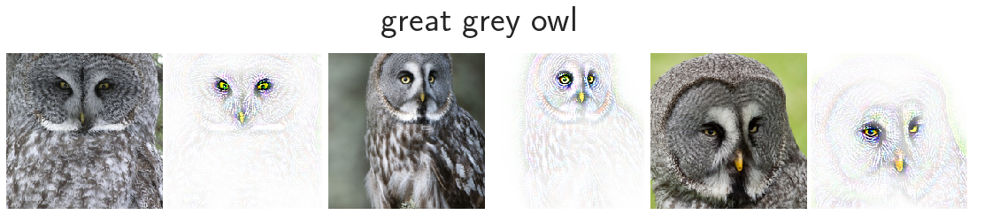

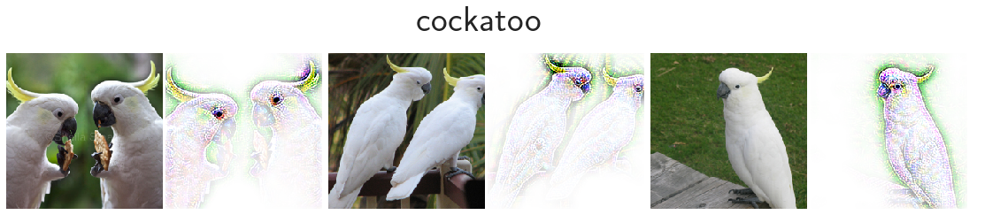

In [15]:
sns.set_style("white")

for class_idx in sorted_classes[:num_classes]:
    visualise_class_explanations(model, class_idx, offset[class_idx], data_loader)

## Comparison to post-hoc

In [16]:
from torch import nn

In [17]:
!git pull

Already up to date.


In [18]:
from interpretability.explanation_methods.explainers.captum import IxG, IntGrad, DeepLIFT, GradCam
from interpretability.explanation_methods.explainers.rise import RISE
from interpretability.explanation_methods.explainers.lime import Lime



In [19]:
class Trainer:
    
    def __init__(self, model):
        super().__init__()
        self.model = model
    
    def predict(self, x):
        return self.model(AddInverse()(x)).sigmoid()
    
    def __call__(self, x):
        return self.model(AddInverse()(x))
    

In [20]:
selected_imgs = [(50*c_idx + offset[c_idx][0]).item() for c_idx in sorted_classes[:15]]

In [21]:
# num_ims = 100
explanation_mode(model, False)
trainer = Trainer(model)
gcam_expl = GradCam(trainer)
lime_expl = Lime(trainer, kernel_size=4, batch_size=32, num_samples=500)
ixg_expl = IxG(trainer)
intG_expl = IntGrad(trainer, internal_batch_size=64)
lift_expl = DeepLIFT(trainer)
rise_expl = RISE(trainer, batch_size=64, n=1500, s=8, p=.1)
pairs = [("GCam", gcam_expl), ("LIME", lime_expl),# ("IxG", ixg_expl), 
         ("IntG", intG_expl),
         ("DeepLIFT", lift_expl), ("RISE", rise_expl), 
        ]

img_tgt_pairs = [data_loader.dataset[im_idx] for im_idx in selected_imgs[::]]
atts = {
    name: [(to_numpy(expl.attribute((img[None]).cuda(), tgt.argmax())),
              print(f"\r{name}: {idx+1}/{len(selected_imgs)}", end="" if idx+1 != len(selected_imgs) else "\n"))[0]
             for idx, (img, tgt) in enumerate(img_tgt_pairs)]
    for name, expl in pairs
       }

GCam: 15/15
LIME: 15/15


/BS/restricted_networks2/work/cvpr2022_final_test/interpretability/explanation_methods/utils.py:66: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return self.__class__.__bases__[-1].attribute(self, img, target=torch.tensor(target).cuda(), **self.configs)


IntG: 15/15
DeepLIFT: 1/15

/BS/restricted_networks/work/anaconda3/envs/torch1.6/lib/python3.7/site-packages/captum/attr/_utils/gradient.py:33: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  "required_grads has been set automatically." % index
/BS/restricted_networks/work/anaconda3/envs/torch1.6/lib/python3.7/site-packages/captum/attr/_core/deep_lift.py:301: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  after the attribution is finished"""


DeepLIFT: 15/15
RISE: 15/15


In [22]:
our_atts = []
explanation_mode(model, True)

for im_idx in selected_imgs[::]:
    img, tgt = data_loader.dataset[im_idx]
    _img = Variable(AddInverse()(img[None]).cuda(), requires_grad=True)
    model.zero_grad()
    out = model(_img)[0, tgt.argmax()]
    out.backward()
    our_atts.append(grad_to_img(_img[0], _img.grad.data[0]))
atts.update({"Ours": our_atts})

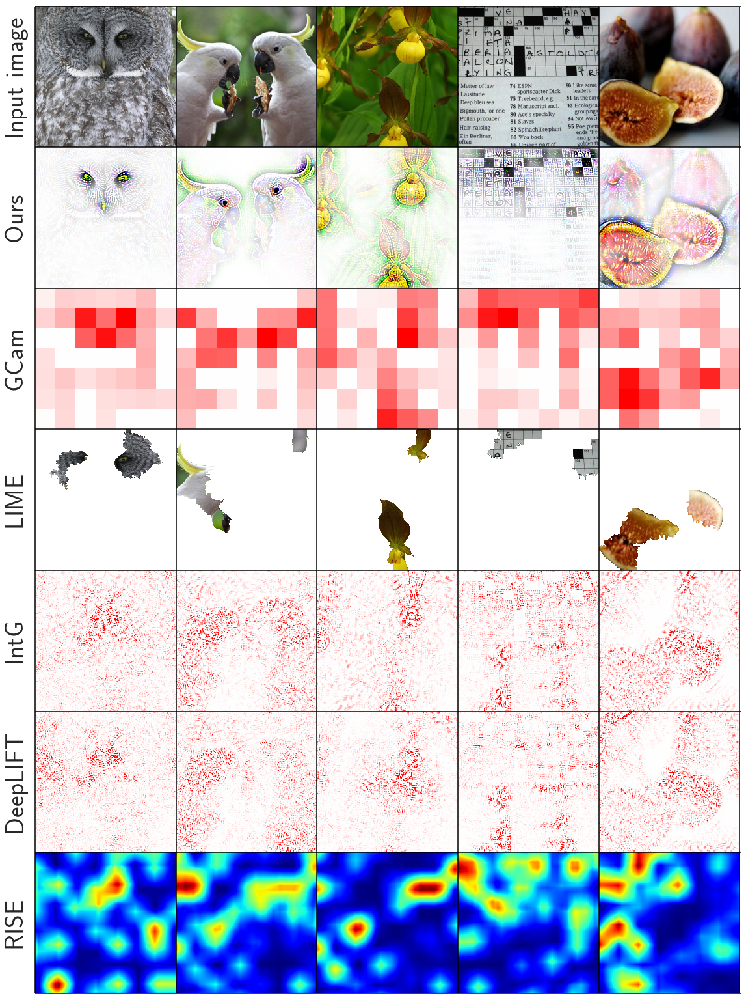

In [23]:
sns.set_style("white")
# selected_imgs = np.arange(num_ims)
num_methods = len(atts)

for count, sel_ims in enumerate(np.array(selected_imgs).reshape(-1, 5)[:3]):

    fig, ax = plt.subplots(1, figsize=(len(sel_ims)*4, (num_methods+1)*4))

    for ax_idx1, im_idx in enumerate(sel_ims):
        running_idx = ax_idx1 + 5 * count
        att_idx = count * 5 + ax_idx1
        img, tgt = img_tgt_pairs[ax_idx1+5*count]
        ax.imshow(to_numpy_img(img), extent=(224*ax_idx1, 224*(ax_idx1+1), 0, 224))
        for ax_idx2, att_name in enumerate(["Ours", "GCam", "LIME", "IntG", "DeepLIFT", "RISE"]):
            if att_name not in  ["Ours", "LIME", "RISE"]:
                exp = atts[att_name][att_idx][0].sum(0)
                vrange = np.percentile(exp, 99.5)
                ax.imshow(exp.clip(0), vmin=-vrange, vmax=vrange,
                          cmap="bwr",
                         extent=(224*ax_idx1, 224*(ax_idx1+1), -(1+ax_idx2) * 224, -(ax_idx2) * 224))
            elif att_name == "LIME":
                cutout = to_numpy_img(torch.tensor(atts[att_name][att_idx][0]) * img)
                cutout = np.concatenate([cutout, atts[att_name][att_idx][0][0][..., None]], axis=-1)
                ax.imshow(cutout, extent=(224*ax_idx1, 224*(ax_idx1+1), -(1+ax_idx2) * 224, -(ax_idx2) * 224))
            elif att_name == "RISE":
                exp = atts[att_name][att_idx][0].sum(0)
#                 vrange = np.percentile(exp, 99.5)
                ax.imshow(exp.clip(0), vmin=exp.min(), vmax=exp.max(),
                          cmap="jet",
                         extent=(224*ax_idx1, 224*(ax_idx1+1), -(1+ax_idx2) * 224, -(ax_idx2) * 224))
            else:
                ax.imshow(atts[att_name][att_idx],
                         extent=(224*ax_idx1, 224*(ax_idx1+1), -(1+ax_idx2) * 224, -(ax_idx2) * 224))
            if not ax_idx1:
                plt.figtext(-30, -112 * (1+2*ax_idx2), f"{att_name}", transform=ax.transData, fontsize=40,
                            rotation=90, ha="center", va="center")
    plt.figtext(-30, 112, "Input image", transform=ax.transData, fontsize=40,
                            rotation=90, ha="center", va="center")
    ax.set_ylim(-3-224 * (num_methods), 224+3)
    ax.set_xlim(0-3, len(sel_ims)*224+3)
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.hlines([224-224 * i for i in range(0, num_methods+2)], 0, 224*len(selected_imgs))
    ax.vlines([224*i for i in range(len(selected_imgs)+1)], -224*num_methods, 224)
    fig.savefig("docs/media/comparisons.png")
    break

## Ambiguous examples

In [24]:
!git pull

Already up to date.


In [25]:
from interpretability.visualise_neurons import plot_top2_comparison

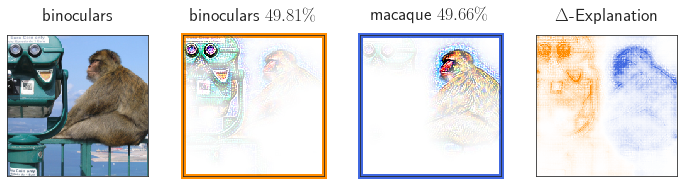

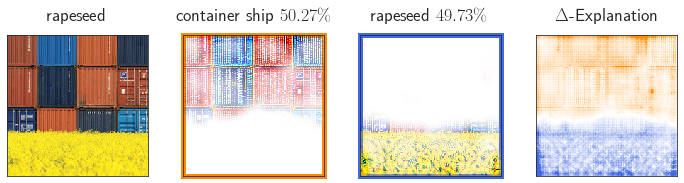

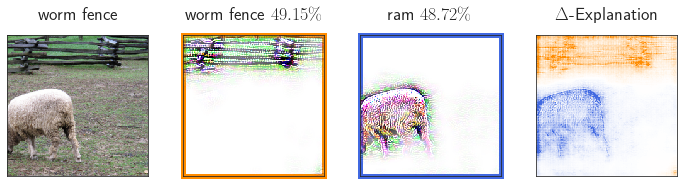

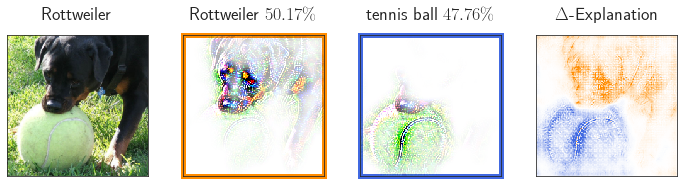

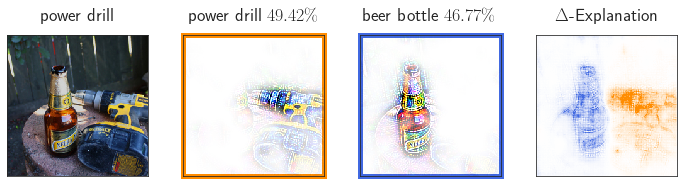

In [26]:
sns.set_style("white")
explanation_mode(model, True)
for im_idx in [22359, 49203, 45644, 11701, 37044]:

    plot_top2_comparison(model, im_idx, data_loader)


# Visualise intermediate neurons

In [27]:
from interpretability.visualise_neurons import visualise_intermediate_neuron_large, visualise_intermediate_neuron_grid


In [28]:
# Make sure the model is in explanation mode


In [29]:
neurons = [739, 797, 843, 823, 938, 473, 341]

In [30]:
exp_params = exps["densenet_121_cossched"]
data = Data("Imagenet", only_test_loader=True, **exp_params)
data_loader = data.get_test_loader()
model = get_model(exp_params).cuda()
explanation_mode(model, True)

layer_idx = 7  # Relative layer index in the sequential model (from 1-10)
partial_model = model[0].get_sequential_model()[:model[0].get_layer_idx(layer_idx)]

with open(f"results/{exp_params['exp_name']}/feature_layer_{layer_idx}.json", "r") as file:
    sorted_activations = json.load(file, object_hook=lambda x: {int(k): v for k, v in x.items()})
sorted_neurons = np.loadtxt(f"results/{exp_params['exp_name']}/feature_layer_{layer_idx}_neurons_sorted.txt")
explanation_mode(model, True)


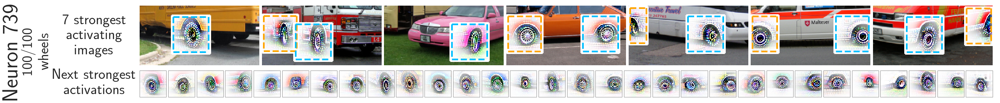

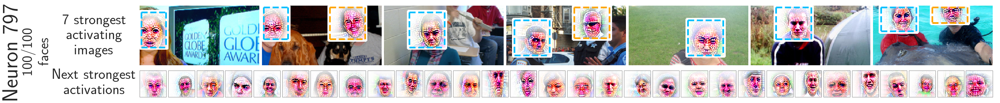

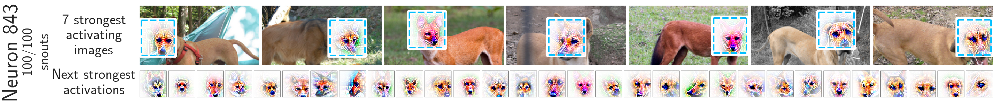

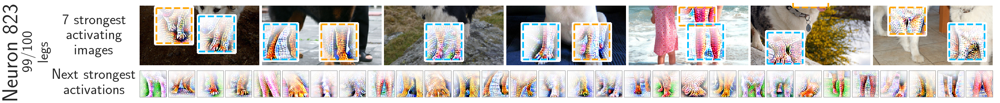

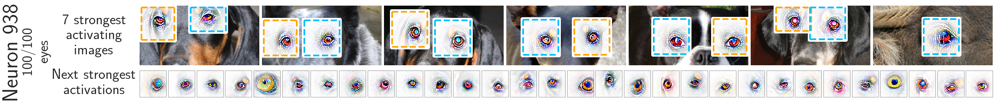

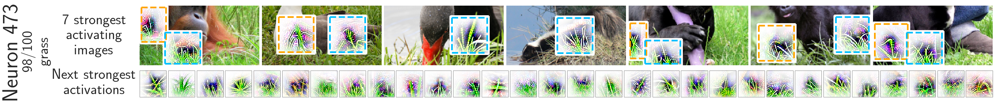

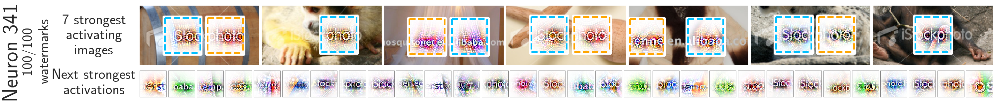

In [31]:
# Alternatively, use ... in sorted_neurons[:N] to visualise the (on average) most active neurons
for neuron in neurons:  
    visualise_intermediate_neuron_large(int(neuron), sorted_activations, partial_model, data);

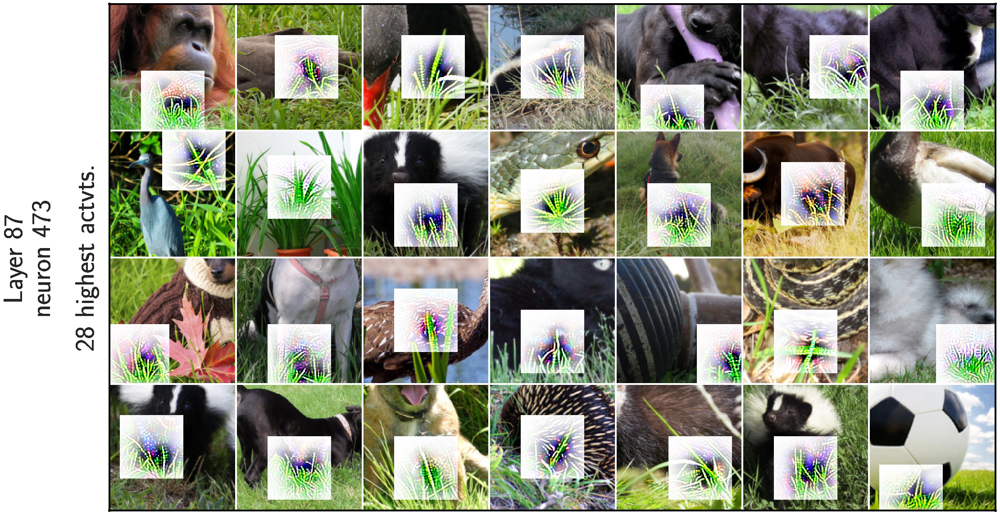

In [32]:
visualise_intermediate_neuron_grid(partial_model, data, neuron_idx=473, layer_idx=layer_idx, 
                                   sorted_activations=sorted_activations,
                                   cols=7, rows=4, scaling=2)

# CIFAR10 — B-ablation

In [33]:
from experiments.CIFAR10.bcos.model import get_model as get_c10_model
from experiments.CIFAR10.bcos.experiment_parameters import exps as c10_exps
exp_params = c10_exps["9L-M2-B1"]
data = Data("CIFAR10", only_test_loader=True, **exp_params)
data_loader = data.get_test_loader()

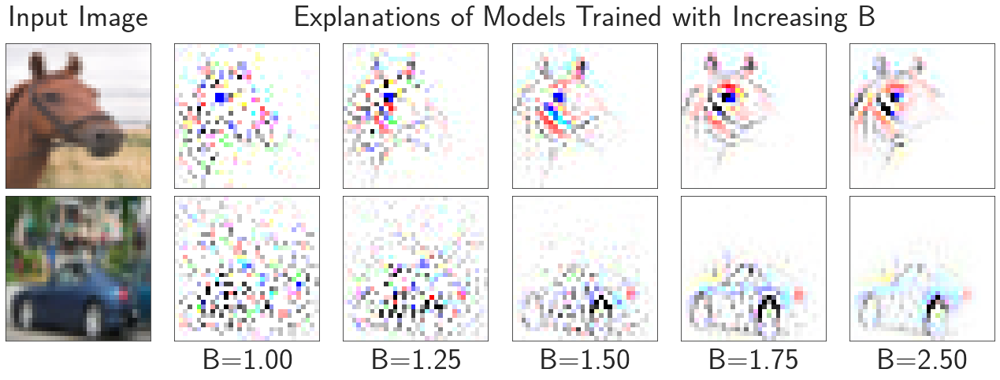

In [34]:
from PIL import Image, ImageEnhance
sns.set_style("white")
BS = [1, 1.25, 1.5, 1.75, 2.5]
n_exps = len(BS)
fig, both_axes = plt.subplots(2, n_exps+1, figsize=np.array((n_exps+1, 1.75))*3)

for img_idx, axes in zip([99, 122], both_axes):
    for ax in axes:
        ax.set_xticks([])
        ax.set_yticks([])
    
    img, tgt = data_loader.dataset[img_idx]
    axes[0].imshow(to_numpy_img(img))
    img = img[None].cuda()
    plt.xticks([])
    plt.yticks([])
    tgt = tgt.argmax().item()
    for ax, B in zip(axes[1:], BS):
        exp_params = c10_exps[f"9L-M2-B{B}"]
        model = get_c10_model(exp_params).cuda()
        explanation_mode(model, True)
        _img = Variable(AddInverse()(img.cuda()), requires_grad=True)
        out = model(_img)[0, tgt]
        out.backward()

        ax.imshow((grad_to_img(_img[0], _img.grad.data[0], smooth=0)))

fig.tight_layout(pad=0, h_pad=1, w_pad=.25)
plt.figtext(16, -6, "Explanations of Models Trained with Increasing B", fontsize=38, ha="center", va="center",
           transform=both_axes[0][3].transData)
plt.figtext(16, -6, "Input Image", fontsize=38, ha="center", va="center",
           transform=both_axes[0][0].transData)
for idx, B in enumerate(BS):
    plt.figtext(16, 36, "B={:.2f}".format(B), fontsize=38, ha="center", va="center",
               transform=both_axes[1][idx+1].transData)
